# 3. Convolution and Frequency Domain Filtering

In this notebook, we'll demonstrate the case for incorporate the Fourier Transform into our convolution process by showing how convolving in the frequency domain is much quicker than the "time" domain. We'll dig a little more into convolution vs. correlation, and we'll start to transition into filtering.

One of the things I'm beginning to appreciate about this book is that we're not just learning the language syntax; I'm actually going out and looking up filtering algorithms on photography sites - digging deeper, you know?

<img src="./img/retriever.gif" />

Code-wise, we'll be looking at `scipy.signal` and `scipy.ndimage.`

Theory-wise, we're going to state what convolution is. The convolution theorem states that convolution between two images is equal to point-wise multiplication in those images' frequency domain:
$$f(x, y) \ast h(x, y) = F(x, y)H(x, y)$$

We'll soon see that the following process:
    <strong>Fourier Transform --> Matrix Multiplication --> Inverse Fourier Transform</strong>

is faster than trying to just convolve directly from one image to another. Remember that it's possible to reconstruct an image from it's transformed product by performing the inverse Fourier transform.

In [1]:
import numpy as np
import scipy.fftpack as fp
import matplotlib.pylab as plb
from scipy import signal
from skimage.io import imread, imshow

In [2]:
im = np.mean(imread('./img/toys.jpg'), axis=2)
gauss_kernel = np.outer(signal.gaussian(im.shape[0], 5), signal.gaussian(im.shape[1], 5))
freq = fp.fft2(im)
assert(freq.shape == gauss_kernel.shape)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain
im1 = fp.ifft2(convolved).real

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:15: ComplexWarning: Casting complex values to real discards the imaginary part
  from ipykernel import kernelapp as app
/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: ComplexWarning: Casting complex values to real discards the imaginary part
/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: ComplexWarning: Casting complex values to real discards the imaginary part


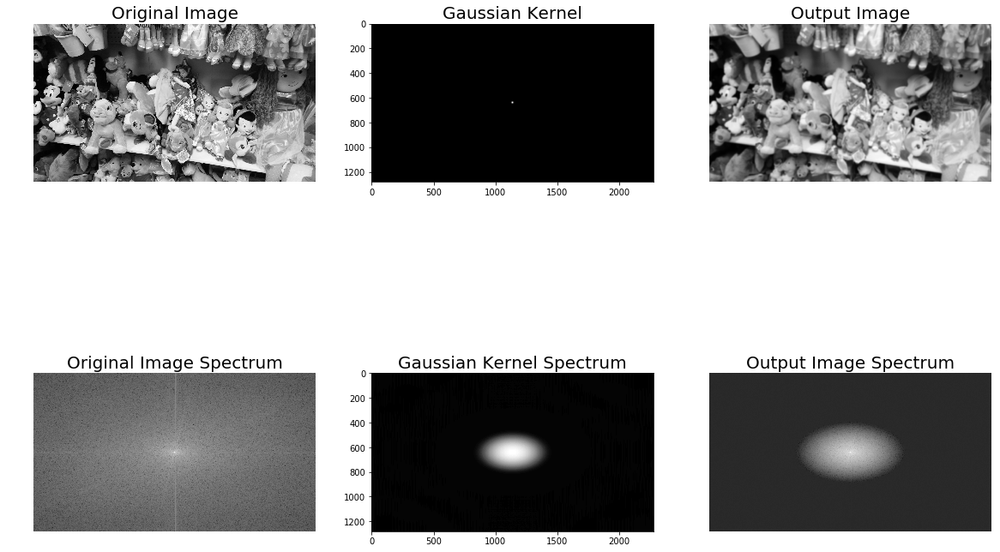

In [3]:
plb.figure(figsize=(20,15))
plb.gray() # show the filtered result in grayscale
plb.subplot(2,3,1)
plb.imshow(im)
plb.title('Original Image', size=20) 
plb.axis('off')
plb.subplot(2,3,2)
plb.imshow(gauss_kernel)
plb.title('Gaussian Kernel', size=20)
plb.subplot(2,3,3)
plb.imshow(im1) # the imaginary part is an artifact
plb.title('Output Image', size=20)
plb.axis('off')
plb.subplot(2,3,4) 
plb.imshow( (20*np.log10( 0.1 + fp.fftshift(freq))).astype(int))
plb.title('Original Image Spectrum', size=20)
plb.axis('off')
plb.subplot(2,3,5)
plb.imshow( (20*np.log10( 0.1 +
fp.fftshift(freq_kernel))).astype(int))
plb.title('Gaussian Kernel Spectrum', size=20)
plb.subplot(2,3,6)
plb.imshow( (20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int))
plb.title('Output Image Spectrum', size=20)
plb.axis('off')
plb.subplots_adjust(wspace=0.2, hspace=0)
plb.show()

<em>What is this?</em> you may be asking. The top row contains the images in the original domain, while the bottom row contains the images in the frequency domain (post-transform).

So, now the question is, <em>why?</em>


Well, the thing is, <em>we didn't just convolve the gauss kernel we created over the original image</em>. We did this in the frequency domain, and reconstructed the image. When we apply the kernel over the image, we're actually multiplying its spectrum by the spectrum of the original image. So any "magic" here is the transform itself, not some black-box convolution method.

#### The Gaussian LPF (low-pass filter) kernel spectrum

Just to <em>really</em> get into it, we'll take a moment to more closely examine the Gaussian filter & its spectrum, which is the result of the application of the logarithm scale, which is what is responsible for the "smoothing" effects of its convolving over a given image.

In [4]:
from skimage.color import rgb2gray  # i know we are supposed to perform imports at the top, but it's too easy to "lose"
                                    # the imports in all of this other content
im = rgb2gray(imread('./img/toys.jpg'))
gauss_kernel = np.outer(signal.gaussian(im.shape[0], 1), signal.gaussian(im.shape[1], 1))
freq = fp.fft2(im)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))

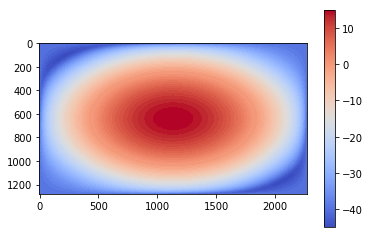

In [5]:
plb.imshow((20 * np.log10(0.01 + fp.fftshift(freq_kernel))).real.astype(int), cmap='coolwarm')
# 0.01 is added to keep the arg to log10 positive & non-zero
plb.colorbar()
plb.show()

### Using scipy.signal.fftconvolve

Of course, we don't <em>have</em> to build our own convolution process/algorithm/function: it's built into the `scipy.signal` module:

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


(2276, 1280)


/usr/lib/python3/dist-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


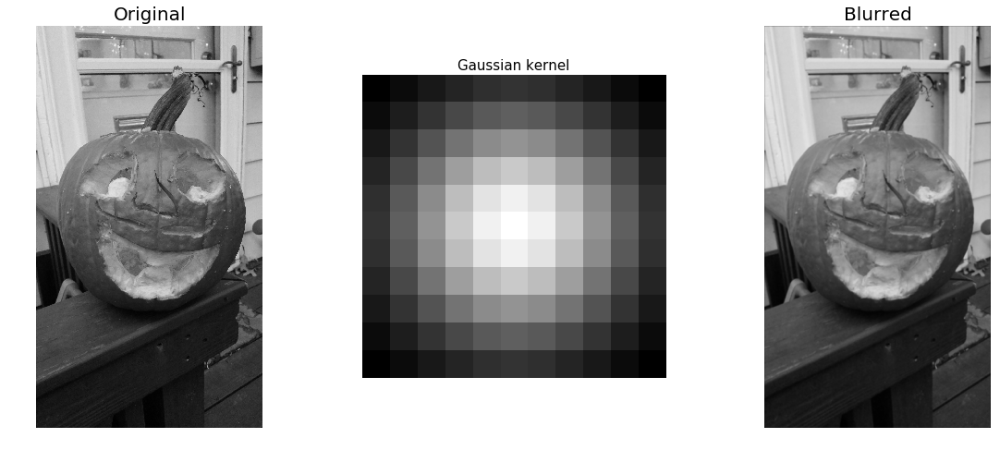

In [6]:
from scipy import misc
im = np.mean(misc.imread('./img/pumpkin.jpg'), axis=2) 
print(im.shape)
# (224, 225)
gauss_kernel = np.outer(signal.gaussian(11, 3), signal.gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
im_blurred = signal.fftconvolve(im, gauss_kernel, mode='same')
fig, (ax_original, ax_kernel, ax_blurred) = plb.subplots(1, 3, figsize=(20,8))
ax_original.imshow(im, cmap='gray')
ax_original.set_title('Original', size=20)
ax_original.set_axis_off()
ax_kernel.imshow(gauss_kernel)
ax_kernel.set_title('Gaussian kernel', size=15)
ax_kernel.set_axis_off()
ax_blurred.imshow(im_blurred, cmap='gray')
ax_blurred.set_title('Blurred', size=20)
ax_blurred.set_axis_off()
fig.show()

Not much difference, but that's a large image. Let's do it again on a smaller copy of this one:

In [7]:
from PIL import Image
pumpkin = Image.open('./img/pumpkin.jpg')
img_small = pumpkin.resize((pumpkin.width // 4, pumpkin.height // 4), Image.ANTIALIAS)
print(img_small.height, img_small.width)
pumpkin_crop = img_small.crop((0, 75, 320, 425))

569 320


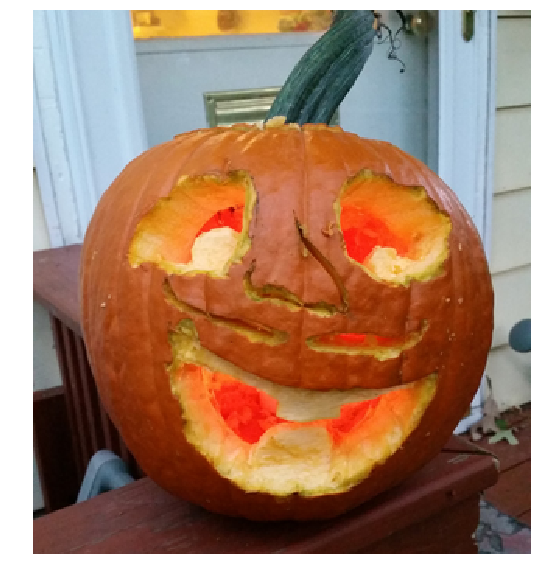

In [8]:
plb.figure(figsize=(10, 10))
plb.imshow(pumpkin_crop)
plb.axis('off')
plb.show()

In [9]:
pumpkin_crop.save('./img/pumpkin_small.jpg')

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


(350, 320)


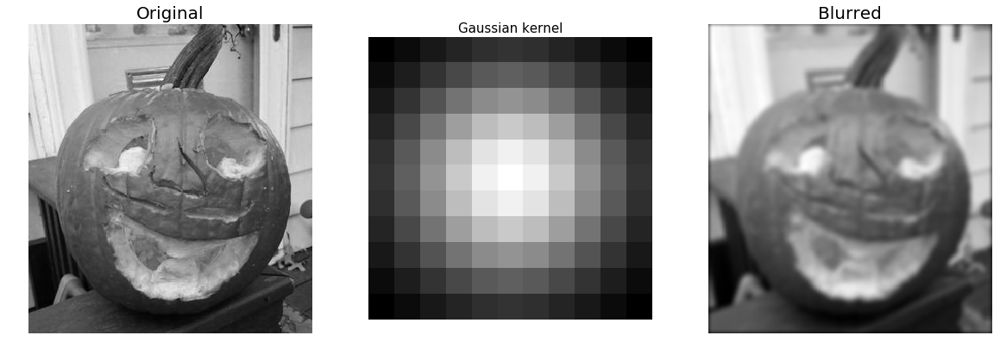

In [10]:
from scipy import misc
im = np.mean(misc.imread('./img/pumpkin_small.jpg'), axis=2) 
print(im.shape)
# (224, 225)
gauss_kernel = np.outer(signal.gaussian(11, 3), signal.gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
im_blurred = signal.fftconvolve(im, gauss_kernel, mode='same')
fig, (ax_original, ax_kernel, ax_blurred) = plb.subplots(1, 3, figsize=(20,8))
ax_original.imshow(im, cmap='gray')
ax_original.set_title('Original', size=20)
ax_original.set_axis_off()
ax_kernel.imshow(gauss_kernel)
ax_kernel.set_title('Gaussian kernel', size=15)
ax_kernel.set_axis_off()
ax_blurred.imshow(im_blurred, cmap='gray')
ax_blurred.set_title('Blurred', size=20)
ax_blurred.set_axis_off()
fig.show()

There we go.

In [11]:
def show_subplot(img, pos, title=None):
    plb.subplot(pos[0], pos[1], pos[2])
    plb.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plb.cm.gray)
    plb.title('Original Image Spectrum', size=20)

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: ComplexWarning: Casting complex values to real discards the imaginary part
  
/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: ComplexWarning: Casting complex values to real discards the imaginary part
  # This is added back by InteractiveShellApp.init_path()


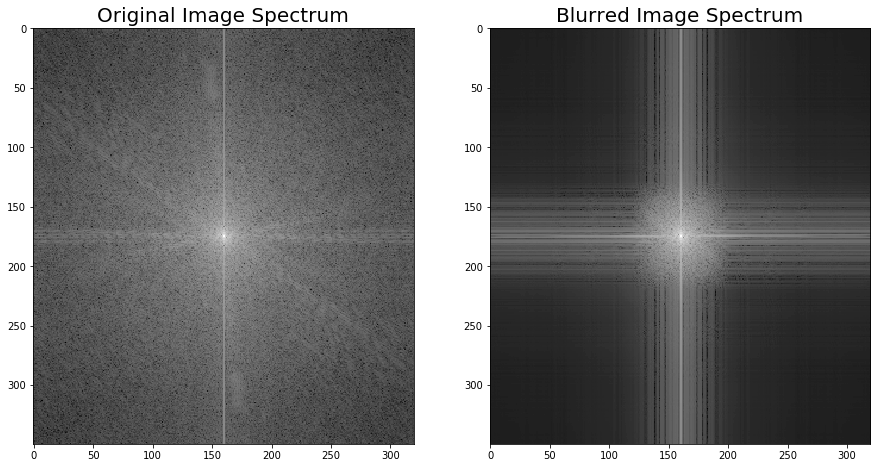

In [12]:
import scipy.fftpack as fftpack
F1 = fftpack.fft2((im).astype(float))
F2 = fftpack.fftshift( F1 )
plb.figure(figsize=(15,8))
plb.subplot(1,2,1)
plb.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plb.cm.gray)
plb.title('Original Image Spectrum', size=20)
F1 = fftpack.fft2((im_blurred).astype(float))
F2 = fftpack.fftshift( F1 )
plb.subplot(1,2,2)
plb.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plb.cm.gray)
plb.title('Blurred Image Spectrum', size=20)
plb.show()

If we want to play with some parameters here, we can change our definition of `gaussian_kernel` to increase the size, with a larger or smaller mean (presently it's 11x11, w/ $\sigma=3$). What does that do to the output image?

## Filtering in the Frequency Domain

Now we begin our turn towards image enhancement, via the Fourier transform. Specifically, we'll look at filtering for contrast enhancement, smoothing, and template matching. To do so, we're going to define more clearly what we mean by high-pass, low-pass, and band-pass filters (HPF, LPF, & BPF).

### High Pass Filter (HPF)

This filter allows only high frequencies from the frequency domain, & blocks low frequencies below a certain cutoff value. High frequency values correspond to edges, details, and noise, so HPFs tend to extract or enhance them. 

Programmatically, we can implement this in the following steps:
<ul><li>Perform the Fourier Transform (DFT / FFT) with `scipy.fftpack.fft2</li><li>keep only the high frequency components</li><li>perform the inverse FFT to reconstruct the image</li></ul>

Easy as that.    

In [13]:
def show_img(image, complex=False):
    plb.figure(figsize=(10, 10))
    plb.imshow(image, cmap=plb.cm.gray)
    plb.axis('off')
    plb.show()

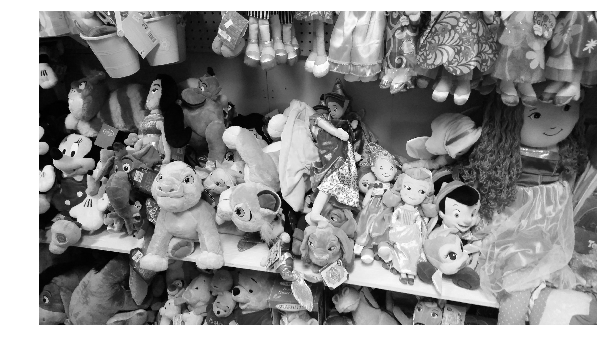

In [14]:
img = np.array(Image.open('./img/toys.jpg').convert('L'))
show_img(img)

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: ComplexWarning: Casting complex values to real discards the imaginary part
  import sys


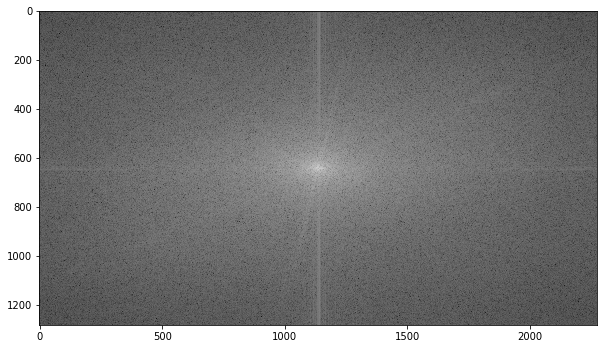

In [15]:
freq = fp.fft2(img)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fp.fftshift(freq1)
plb.figure(figsize=(10, 10))
plb.imshow((20 * np.log10(0.1 + freq2)).astype(int))
plb.show()

Since `fp.fftshift` shifts the 0 value to the center of the array, we can just block out the center & set a 20x20 window around the center to zero. This is admittedly a naive way of doing this, but we <em>are</em> blocking the lowest values for now.

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.


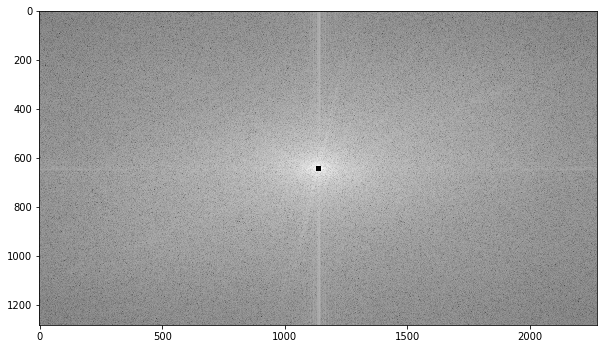

In [16]:
# apply HPF 
freq2[half_w - 10:half_w + 11, half_h - 10: half_h + 11] = 0
plb.figure(figsize=(10, 10))
plb.imshow((20 * np.log10(0.1 + freq2)).astype(int))
plb.show()

And now the inverse transform:

In [18]:
def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)

In [19]:
img1 = np.clip(fp.ifft2(fftpack.ifftshift(freq2)).real, 0, 255)
print(signaltonoise(img1, axis=None))

0.6607134825696378


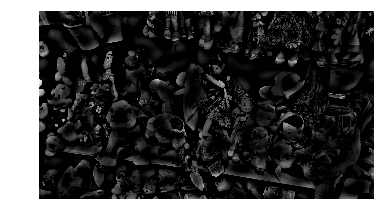

In [20]:
plb.imshow(img1, cmap='gray')
plb.axis('off')
plb.show()

So, this is a crowded image, & even this one ia pretty busy. But we can see that features like faces & feet are displayed quite a bit brighter than the surrounding areas: hari, the wall behind, & the torsos of the toys are a bit darker. I call it a win.

Next, we'll actually <em>set</em> a cutoff value for the filter:

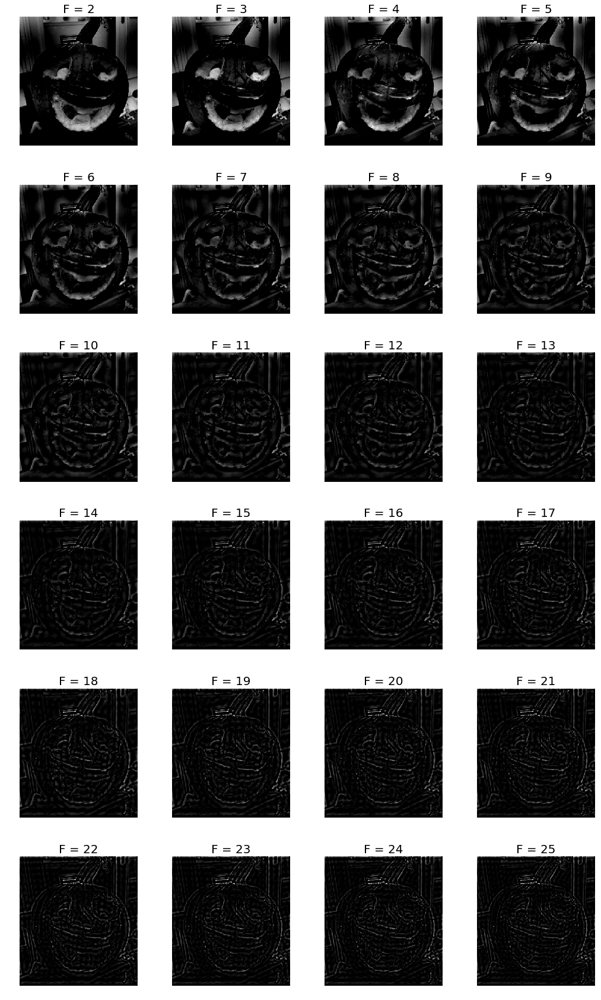

In [26]:
pumpkin = np.array(Image.open('./img/pumpkin_small.jpg').convert('L'))
freq = fp.fft2(pumpkin)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_hp = []
lbs = list(range(1, 25))
plb.figure(figsize=(18, 30))
for l in lbs:
    freq1 = np.copy(freq)
    freq2 = fftpack.fftshift(freq1)
    freq2[half_w - l: half_w + l + 1, half_h - l: half_h + l + 1] = 0
    pumpkin1 = np.clip(fp.ifft2(fftpack.ifftshift(freq2)).real, 0, 255)
    snrs_hp.append(signaltonoise(pumpkin1, axis=None))
    plb.subplot(6, 4, l)
    plb.imshow(pumpkin1, cmap='gray')
    plb.axis('off')
    plb.title('F = ' + str(l + 1), size=20)
plb.subplots_adjust(wspace=0.1, hspace=0.3)
plb.show()

From this layout we can see that increasing the cutoff value $F$ appears to accentuate the edges more & discards more non-edge information, like contrast. 

Next, we'll plot the signal-to-noise ratio as a function of the cutoff frequency:

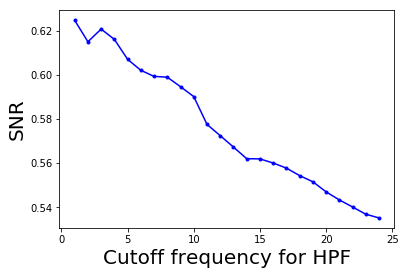

In [27]:
plb.plot(lbs, snrs_hp, 'b.-')
plb.xlabel('Cutoff frequency for HPF', size=20)
plb.ylabel('SNR', size=20)
plb.show()

### Low-Pass Filters

As you may probably be able to guess now, this filter allows the <em>low</em> frequencies from the frequency domain (post-DFT version of the image), and blocks the high frequencies beyond a given cutoff value. In the reconstructed image, noise, edges, & details will be more likely to be removed. <em>I'm going to guess that these are going to be the smoothing filters</em>.

In our exploration of `scipy`, the `ndimage` submodule will play a large role here.

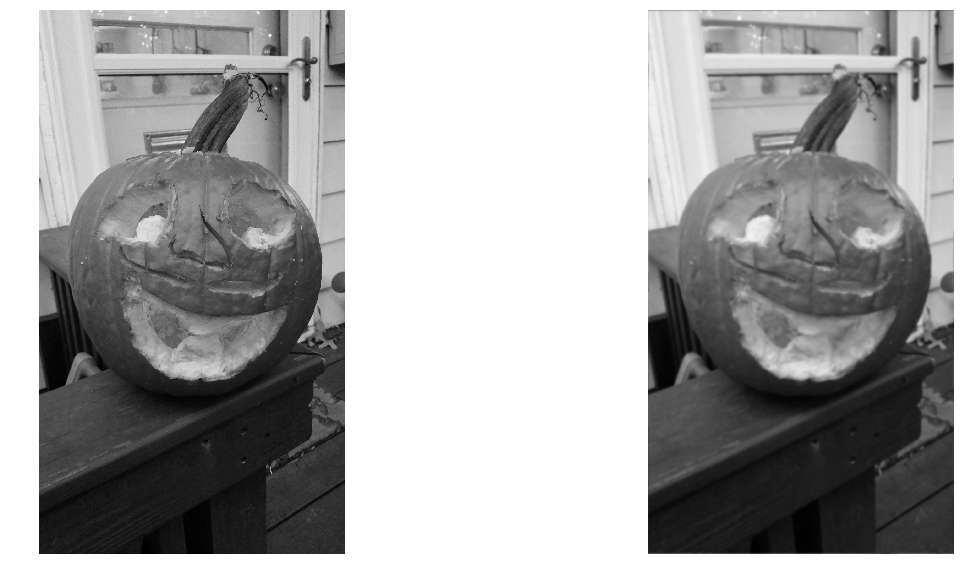

In [29]:
from scipy import ndimage
fig, (ax1, ax2) = plb.subplots(1, 2, figsize=(20, 10))
plb.gray()
img = np.mean(imread('./img/pumpkin.jpg'), axis=2)
freq = fp.fft2(img)
freq_gaussian = ndimage.fourier_gaussian(freq, sigma=4)
img1 = fp.ifft2(freq_gaussian)
ax1.imshow(img)
ax1.axis('off')
ax2.imshow(img1.real)
ax2.axis('off')
plb.show()

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  


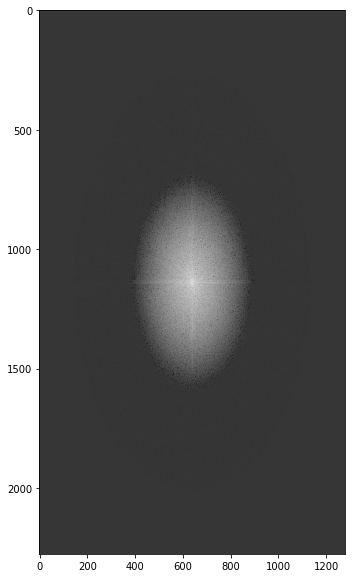

In [31]:
plb.figure(figsize=(10,10))
plb.imshow( (20*np.log10( 0.1 + np.fft.fftshift(freq_gaussian))).astype(int))
plb.show()

So now we go through that same process as before, but this time we block the high frequency values and let the low frequency values through.

In [32]:
freq = fp.fft2(img)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fftpack.fftshift(freq1)
freq2_low = np.copy(freq2)
freq2_low[half_w - 10: half_w + 11, half_h - 10: half_h + 11] = 0  # blocking low frequencies?
freq2 -= freq2_low  # select only the first 20x20 low frequencies, block the high ones
img1 = fp.ifft2(fftpack.ifftshift(freq2)).real
print(signaltonoise(img1, axis=None))

1.6953777567491954


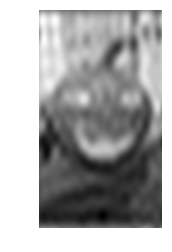

In [33]:
plb.imshow(img1, cmap='gray')
plb.axis('off')
plb.show()

...and the same with a dynamically changing cutoff value:

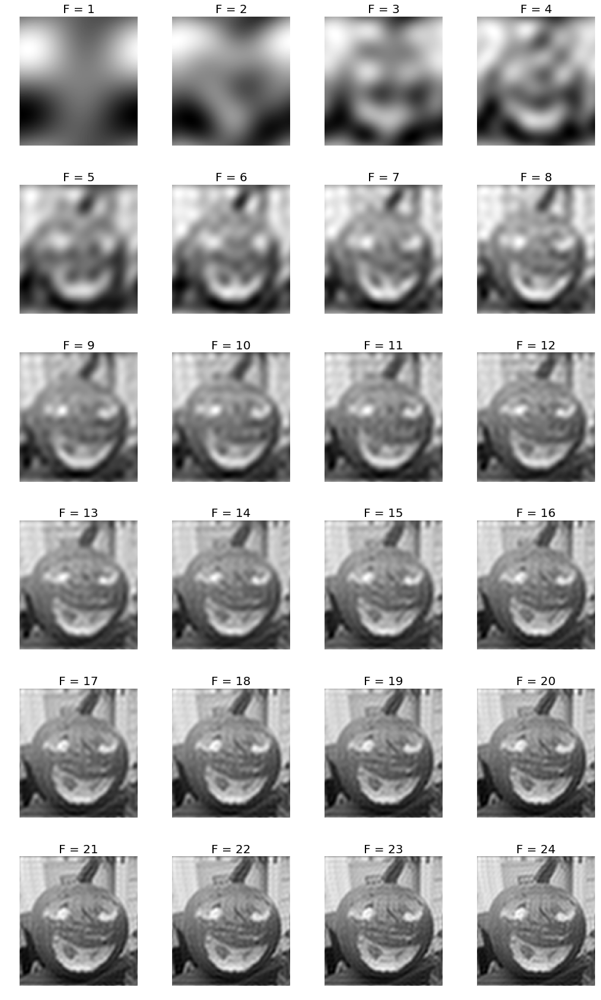

In [34]:
pumpkin = np.array(Image.open('./img/pumpkin_small.jpg').convert('L'))
freq = fp.fft2(pumpkin)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_lp = []
ubs = list(range(1, 25))
plb.figure(figsize=(18, 30))
for u in ubs:
    freq1 = np.copy(freq)
    freq2 = fftpack.fftshift(freq1)
    freq2_low = np.copy(freq2)
    freq2_low[half_w - u: half_w + u + 1, half_h - u: half_h + u + 1] = 0
    freq2 -= freq2_low
    pumpkin1 = fp.ifft2(fftpack.ifftshift(freq2)).real
    snrs_lp.append(signaltonoise(pumpkin1, axis=None))
    plb.subplot(6, 4, u)
    plb.imshow(pumpkin1, cmap='gray')
    plb.axis('off')
    plb.title('F = ' + str(u), size=20)
plb.subplots_adjust(wspace=0.1, hspace=0.3)
plb.show()

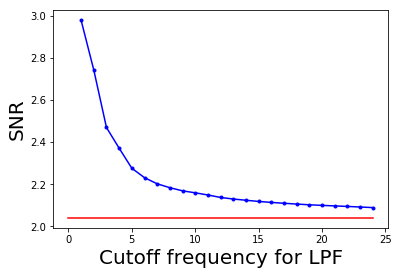

In [35]:
snr = signaltonoise(pumpkin, axis=None)
plb.plot(ubs, snrs_lp, 'b.-')
plb.plot(range(25), [snr]*25, 'r-')
plb.xlabel('Cutoff frequency for LPF', size=20)
plb.ylabel('SNR', size=20)
plb.show()

## Band-Pass Filters with DoG

(DoG: <strong>Difference of Gaussian</strong> kernel)

This is another kind of filter that allows frequencies in a certain band to pass through, blocking the other frequencies. Here we go:

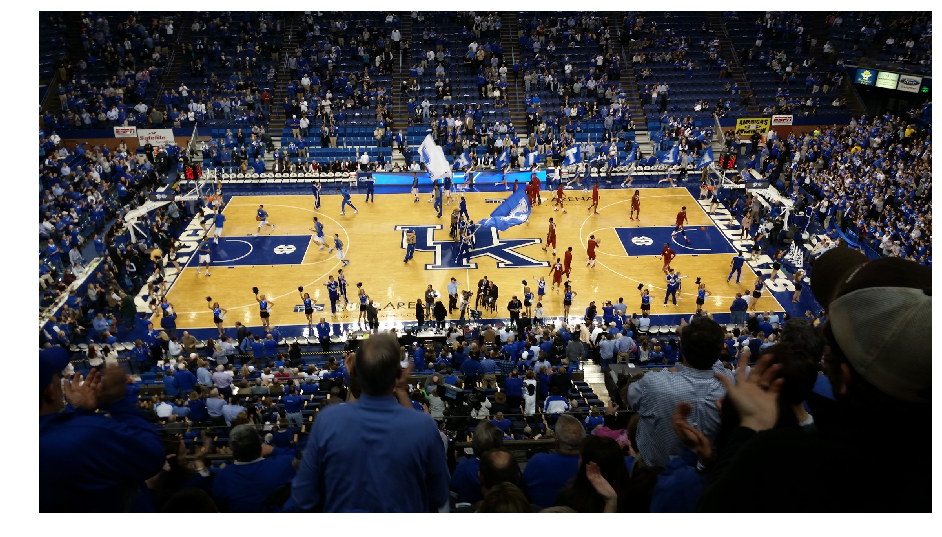

In [39]:
from skimage import img_as_float
img = img_as_float(plb.imread('./img/uk.jpg'))
plb.figure(figsize=(16, 30))
plb.imshow(img)
plb.axis('off')
plb.show()

0.8777945324312296


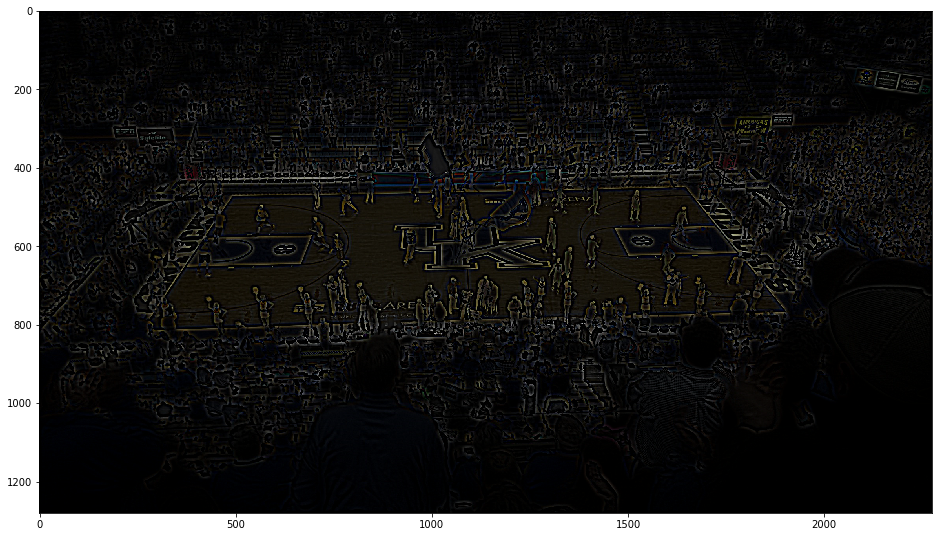

In [38]:
x = np.linspace(-10, 10, 15)
kernel_1d = np.exp(-0.005*x**2)
kernel_1d /= np.trapz(kernel_1d)  # normalizing sum to 1
gauss_kernel1 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
kernel_1d = np.exp(-5*x**2)
kernel_1d /= np.trapz(kernel_1d)  # normalizing sum to 1
gauss_kernel2 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
DoG_kernel = gauss_kernel1[:, :, np.newaxis] - gauss_kernel2[:, :, np.newaxis]
img1 = signal.fftconvolve(img, DoG_kernel, mode='same')
plb.figure(figsize=(16, 30))
plb.imshow(np.clip(img1, 0, 1))
print(np.max(img1))
plb.show()

Not very useful without being able to control which band or bands to pass, but it's an introduction to the concept. We have more of an "ah-ha!" moment when we

### Use a Band-stop (Notch) Filter to Remove Periodic Noise from Images

In [82]:
cat = np.mean(imread('./img/kolya.jpg'), axis=2) / 255
print(cat.shape)

(2276, 1280)


/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  if __name__ == '__main__':
/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: ComplexWarning: Casting complex values to real discards the imaginary part


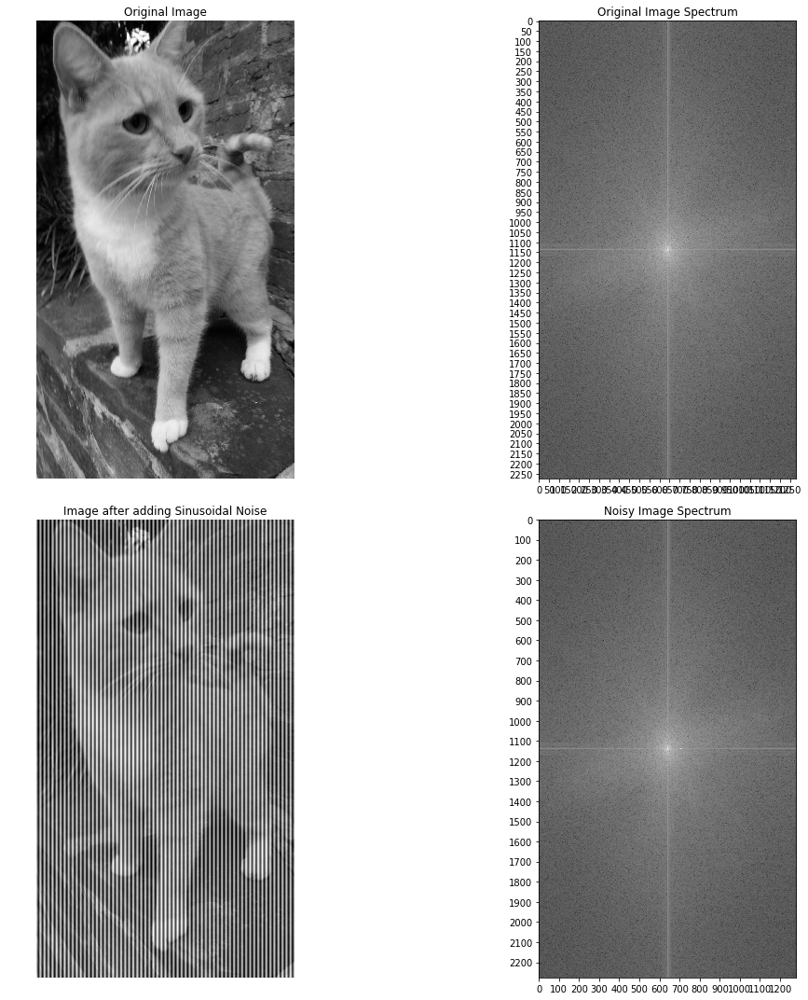

In [83]:
plb.figure(figsize=(18, 15))
plb.subplot(2, 2, 1)
plb.imshow(cat, cmap='gray')
plb.axis('off')
plb.title('Original Image')
F1 = fftpack.fft2((cat).astype(float))
F2 = fftpack.fftshift(F1)
plb.subplot(2, 2, 2)
plb.imshow((20 * np.log10(0.1 + F2)).astype(int), cmap=plb.cm.gray)
plb.xticks(np.arange(0, cat.shape[1], 50))
plb.yticks(np.arange(0, cat.shape[0], 50))
plb.title('Original Image Spectrum')
# add periodic noise to the image
for n in range(cat.shape[1]):
    cat[:, n] += np.cos(0.1*np.pi*n)
plb.subplot(2, 2, 3)
plb.imshow(cat, cmap='gray')
plb.axis('off')
plb.title('Image after adding Sinusoidal Noise')
F1 = fftpack.fft2((cat).astype(float))  # noisy spectrum
F2 = fftpack.fftshift(F1)
plb.subplot(2, 2, 4)
plb.imshow((20 * np.log10(0.1 + F2)).astype(int), cmap=plb.cm.gray)
plb.xticks(np.arange(0, cat.shape[1], 100))
plb.yticks(np.arange(0, cat.shape[0], 100))
plb.title('Noisy Image Spectrum')
plb.tight_layout()

Alright, now we've messed up our image; let's apply a notch filter to eliminate the frequencies that are responsible for this noise by setting the corresponding frequency components to zero:

In [62]:
w, h = F2.shape
print(w, h)

2276 1280


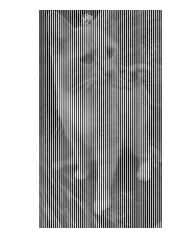

In [70]:
F2_copy = np.copy(F2)
F2_copy[170:176,:220] = F2_copy[170:176,230:] = 0 # eliminate the frequencies most likely responsible for noise (keep some low frequency components)
im1 = fftpack.ifft2(fftpack.ifftshift( F2_copy )).real
plb.axis('off')
plb.imshow(im1, cmap='gray')
plb.show()

Not quite the same output as in the source. It would be nice to know where the author got the values in question...  

Oh, the values are there in the plot. Let's do that:

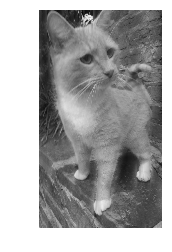

In [84]:
F2[1130:1145, :630] = F2[1130:1145, 645:] = 0 # eliminate the frequencies most likely responsible for noise (keep some low frequency components)
im1 = fftpack.ifft2(fftpack.ifftshift( F2 )).real
plb.axis('off')
plb.imshow(im1, cmap='gray')
plb.show()

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  """Entry point for launching an IPython kernel.


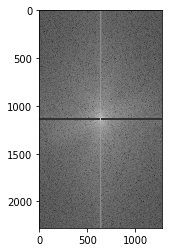

In [85]:
plb.imshow((20 * np.log10(0.1 + F2)).astype(int), cmap=plb.cm.gray)
plb.show()

Quite a bit better, though we notice some blurring in the legs. Some adjustment to the values we filter out are necessary.

### Degradation Models & Image Restoration

So we see that it's possible to reconstruct images by modeling the degradation, we still meet the challenge of noise & loss of information. So we need to make sure we're simulating/modeling the degradation appropriately.

One of the ways we try to restore images is by removing the blur, via <strong>deconvolution</strong>. We'll start exploring this with the inverse filter. We'll blur our cat photo to start with, then try to get it back:

In [87]:
# we should resize this huge image
cat = Image.open('./img/kolya.jpg')
cat_small = cat.resize((cat.width // 4, cat.height // 4), Image.ANTIALIAS)
print(cat_small.height, cat_small.width)
#cat_crop = img_small.crop((0, 75, 320, 425))

569 320


In [90]:
cat_small.save('./img/kolya_small.jpg')

In [96]:
cat = 255 * rgb2gray(imread('./img/kolya_small.jpg'))
gauss_kernel = np.outer(signal.gaussian(cat.shape[0], 3), signal.gaussian(cat.shape[1], 3))
freq = fp.fft2(cat)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq * freq_kernel
cat_blur = fp.ifft2(convolved).real
cat_blur = 255 * cat_blur / np.max(cat_blur)

253.72500000000002 255.0


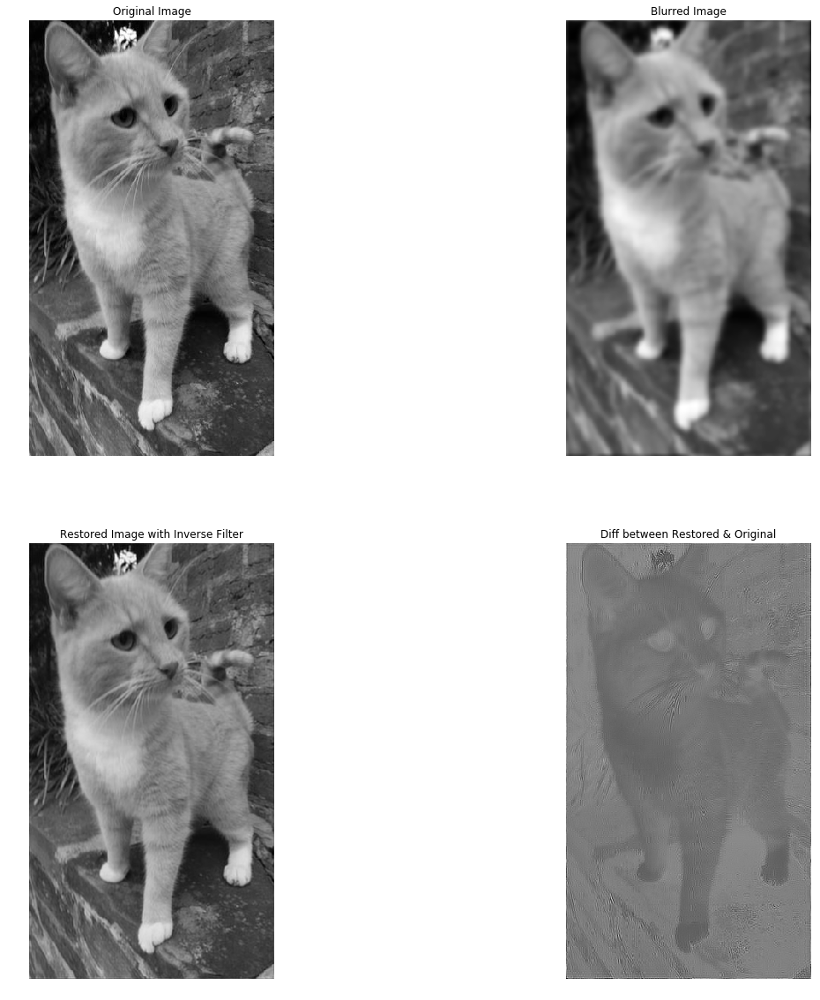

In [97]:
epsilon = 10 ** -6
freq = fp.fft2(cat_blur)
freq_kernel = 1 / (epsilon + freq_kernel)  # avoid division by 0
convolved = freq * freq_kernel
cat_restored = fp.ifft2(convolved).real
cat_restored = 255 * cat_restored / np.max(cat_restored)
print(np.max(cat), np.max(cat_restored))
plb.figure(figsize=(20, 20))
plb.gray()
plb.subplot(221)
plb.imshow(cat)
plb.title('Original Image')
plb.axis('off')
plb.subplot(222)
plb.imshow(cat_blur)
plb.title('Blurred Image')
plb.axis('off')
plb.subplot(223)
plb.imshow(cat_restored)
plb.title('Restored Image with Inverse Filter')
plb.axis('off')
plb.subplot(224)
plb.imshow(cat_restored - cat)
plb.title('Diff between Restored & Original')
plb.axis('off')
plb.show()

### Image Deconvolution with the Wiener Filter

Now we'll look at a signal corrupted with noise, & how to restore it. The Wiener filter is an unsupervised filter used for image denoising.

In [103]:
from skimage import color, data, restoration
from scipy.signal import convolve2d as conv2
img = color.rgb2gray(imread('./img/jellyfish.jpg'))
n = 7
psf = np.ones((n, n)) / n ** 2
img1 = conv2(img, psf, 'same')
img1 += 0.5 * img.std() * np.random.standard_normal(img.shape)
img2, _ = restoration.unsupervised_wiener(img1, psf)

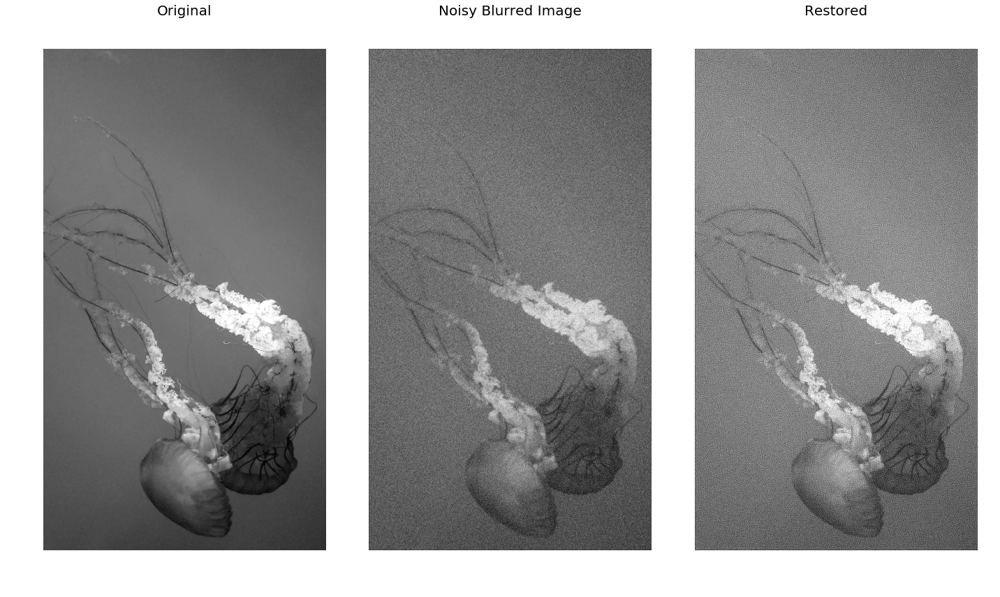

In [104]:
fig, ax = plb.subplots(nrows=1, ncols=3, figsize=(20, 12), sharex=True, sharey=True)
plb.gray()
ax[0].imshow(img)
ax[0].axis('off')
ax[0].set_title("Original", size=20)
ax[1].imshow(img1)
ax[1].axis('off')
ax[1].set_title("Noisy Blurred Image", size=20)
ax[2].imshow(img2)
ax[2].axis('off')
ax[2].set_title("Restored", size=20)
fig.tight_layout()
plb.show()